In [19]:
import pandas as pd
from skimage.color import rgb2gray
from skimage.measure import find_contours
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2 as cv2
import cv2 as cv
import skimage.io as io
from skimage.morphology import binary_erosion, binary_dilation, binary_closing, skeletonize, thin
from skimage.filters import gaussian
from tempfile import TemporaryFile
import numpy as np
from matplotlib.pyplot import imshow
from CommunFunction import *
from PIL import Image
import PIL
import os
import glob
import threading
import time
import csv
%matplotlib inline


def resize(image, width=200, hsize=None):
    base_width = width
    width_percent = (base_width / float(image.size[0]))
    hsize = int(
        (float(image.size[1]) * float(width_percent))) if hsize == None else hsize
    image = image.resize((base_width, hsize), PIL.Image.ANTIALIAS)
    return image


def adjust_gamma(image, gamma=1.0):
    # build a lookup table mapping the pixel values [0, 255] to
    #     their adjusted gamma values
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
    # apply gamma correction using the lookup table
    return cv2.LUT(image, table)


def show_histo(img):
    dst = cv2.calcHist(img, [0], None, [256], [0, 256])
    plt.hist(img.ravel(), 256, [0, 256])
    plt.title('Histogram for gray scale image')
    plt.show()


def get_result(img, mask):
    copy = img.copy()
    channels = img.shape[2]
    for i in range(channels):
        copy[:, :, i] = np.bitwise_and(copy[:, :, i], mask)
    temp = mask.copy()
    temp[mask == 0] = 255
    temp[mask == 255] = 0
    for i in range(channels):
        copy[:, :, i] = np.bitwise_or(copy[:, :, i], temp)
    return copy


def shadow_remove(img):
    rgb_planes = cv2.split(img)
    result_norm_planes = []
    for plane in rgb_planes:
        dilated_img = cv2.dilate(plane, np.ones((7, 7), np.uint8))
        bg_img = cv2.medianBlur(dilated_img, 21)
        diff_img = 255 - cv2.absdiff(plane, bg_img)
        norm_img = cv2.normalize(
            diff_img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
        result_norm_planes.append(norm_img)
    shadowremov = cv2.merge(result_norm_planes)
    return shadowremov


def reduce_image(img, thickness):
    mask1 = img.copy()
    mask1[:thickness, :] = 0
    mask1[-1*thickness:, :] = 0
    mask1[:, :thickness] = 0
    mask1[:, -1*thickness:] = 0
    return mask1


def get_binary_low_medium_constract(img_RGB):
    gray = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2GRAY)
    # ret, img_binary_gray = cv2.threshold(
    #     gray, 125, 255, cv2.THRESH_BINARY)
    # show_images([gray, img_binary_gray])
    img_HSV = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2HSV)
    ret, img_binary = cv2.threshold(
        img_HSV[:, :, 1], 65, 255, cv2.THRESH_BINARY)
    ret, img_binary2 = cv2.threshold(
        img_HSV[:, :, 2], 60, 255, cv2.THRESH_BINARY)
    img_binary[img_binary2 == 0] = 0
    # img_binary[img_binary_gray == 255] = 255
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))

    # Apply erosion to the image
    erode_img = cv2.dilate(img_binary, kernel, iterations=2)
    dilate_img = cv2.erode(erode_img, kernel, iterations=2)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=2)
    dilate_img = cv2.erode(erode_img, kernel, iterations=2)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=2)
    dilate_img = cv2.erode(erode_img, kernel, iterations=2)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=2)
    dilate_img = cv2.erode(erode_img, kernel, iterations=2)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=2)
    dilate_img = cv2.erode(erode_img, kernel, iterations=2)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=2)
    dilate_img = cv2.erode(erode_img, kernel, iterations=2)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=2)
    dilate_img = cv2.erode(erode_img, kernel, iterations=2)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=4)
    return erode_img


def get_binary_heigh_constract(img_RGB):
    # img_RGBA = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2RGBA)
    # img_gray = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2GRAY)
    # ret, img_binary = cv2.threshold(img_gray, 60, 255, cv2.THRESH_BINARY_INV)
    # img_HSV = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2HSV)
    # img_YCC = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2YCR_CB)
    # img_BGR = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2BGR)
    img_YUV = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2YUV)

    # Make float and divide by 255 to give BGRdash
    # bgrdash = img_BGR.astype(np.float)/255.

    # hls_img = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2HLS)
    # lab_img = cv.cvtColor(img_RGB, cv.COLOR_RGB2LAB)

    # img_HSV[:, :, 0] = cv2.equalizeHist(img_HSV[:, :, 0])
    # img_HSV[:, :, 1] = cv2.equalizeHist(img_HSV[:, :, 1])
    # img_HSV[:, :, 2] = cv2.equalizeHist(img_HSV[:, :, 2])

    # img_YCC[:, :, 0] = cv2.equalizeHist(img_YCC[:, :, 0])
    # img_YCC[:, :, 1] = cv2.equalizeHist(img_YCC[:, :, 1])
    # img_YCC[:, :, 2] = cv2.equalizeHist(img_YCC[:, :, 2])

#     img_YUV[:, :, 0] = cv2.equalizeHist(img_YUV[:, :, 0])
#     img_YUV[:, :, 1] = cv2.equalizeHist(img_YUV[:, :, 1])
    img_YUV[:, :, 2] = cv2.equalizeHist(img_YUV[:, :, 2])

    # hls_img[:, :, 0] = cv2.equalizeHist(hls_img[:, :, 0])
    # hls_img[:, :, 1] = cv2.equalizeHist(hls_img[:, :, 1])
    # hls_img[:, :, 2] = cv2.equalizeHist(hls_img[:, :, 2])

    # lab_img[:, :, 0] = cv2.equalizeHist(lab_img[:, :, 0])
    # lab_img[:, :, 1] = cv2.equalizeHist(lab_img[:, :, 1])
    # lab_img[:, :, 2] = cv2.equalizeHist(lab_img[:, :, 2])

    ret, img_binary1 = cv2.threshold(
        img_YUV[:, :, 2], 180, 255, cv2.THRESH_BINARY)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    dilate_img = cv2.erode(img_binary1, kernel, iterations=1)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=1)
    dilate_img = cv2.erode(erode_img, kernel, iterations=1)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=1)
    dilate_img = cv2.erode(erode_img, kernel, iterations=1)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=1)
    dilate_img = cv2.erode(erode_img, kernel, iterations=1)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=1)
    dilate_img = cv2.erode(erode_img, kernel, iterations=1)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=1)
    dilate_img = cv2.erode(erode_img, kernel, iterations=1)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=1)
    dilate_img = cv2.erode(erode_img, kernel, iterations=1)
    erode_img = cv2.dilate(dilate_img, kernel, iterations=3)
    return dilate_img


def calculate_brightness(gray, index=None):
    mean_value = cv2.mean(gray)[0]
    if index is not None:
        show_images([gray], [str(index)])
        print("the image "+str(index)+" has mean value : ", mean_value)
    return mean_value


def image_pre_processing(path):
    image = Image.open(path)
    image = resize(image, 4 * 128, 4 * 64)
    img_RGB = np.array(image)
    gray = cv2.cvtColor(img_RGB, cv2.COLOR_RGB2GRAY)
    mean_value = calculate_brightness(gray)
    dilate_img = None
    if (mean_value >= 190):
        dilate_img = get_binary_heigh_constract(img_RGB)
    else:
        dilate_img = get_binary_low_medium_constract(img_RGB)
    dilate_img[dilate_img == 255] = 1
    mask1 = dilate_img
    mask1[mask1 != 1] = 0
    mask1[mask1 == 1] = 255
    mask1 = reduce_image(img=mask1, thickness=3)

    blured = cv2.GaussianBlur(mask1, (5, 5), 0)
    edges = cv2.Canny(blured, threshold1=40, threshold2=100,
                      apertureSize=3, L2gradient=False)

    # Define the kernel for closing operation
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))

    # Perform closing operation
    closed_edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)
    # show_images([img_gray,edges,closed_edges],['img_gray','edges','closed_edges'])
    contours, hierarchy = cv2.findContours(
        closed_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    # print(len(contours))
    mask = np.zeros_like(edges)
    max_area = 0
    second_max = 0
    biggest_contour = None
    second_biggest = None
    for cnt in contours:
        #     mask=cv2.drawContours(mask, [cnt], -1, (255,255,255), -1)
        area = cv2.contourArea(cnt)
        if area > max_area:
            max_area = area
            biggest_contour = cnt
    if len(contours) > 0:
        mask = cv2.drawContours(
            mask, [biggest_contour], -1, (255, 255, 255), -1)
    result = get_result(img_RGB, mask)
    kernel = np.ones((5, 5), np.float32)/25
    result = cv.filter2D(result, -1, kernel)
    result = cv2.resize(result, (128, 64))
    result = cv2.cvtColor(result, cv2.COLOR_RGB2GRAY)
    return mask, result


with open('true.csv', 'r') as csvfile:
    reader = csv.reader(csvfile)
    with open('output.txt', 'w') as txtfile:
        for row in reader:
            if row: # check if row is not empty
                txtfile.write(row[0]+','+row[1] + '\n')



C:\Users\DELL2019\AppData\Local\Temp\ipykernel_17684\3125313567.py:31: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  image = image.resize((base_width, hsize), PIL.Image.ANTIALIAS)


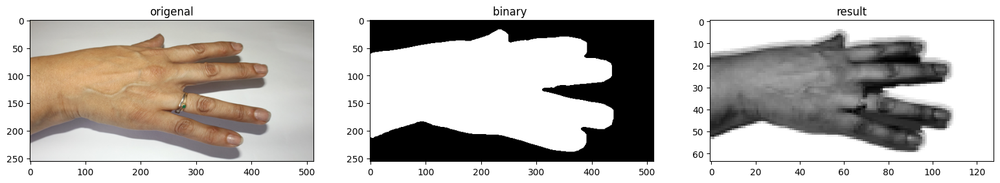

actualy:  5  predected : 4

./Dataset_new_filtered/women/5/5_woman (63).JPG


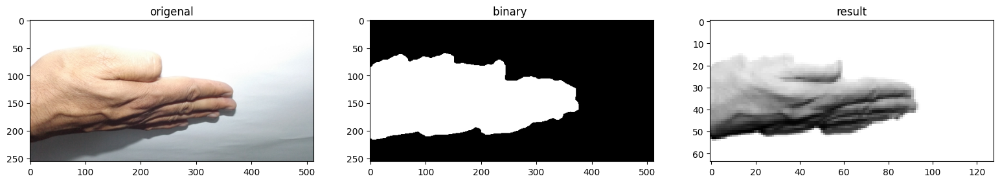

actualy:  4  predected : 2

./Dataset_new_filtered/men/4/4_men (40).JPG


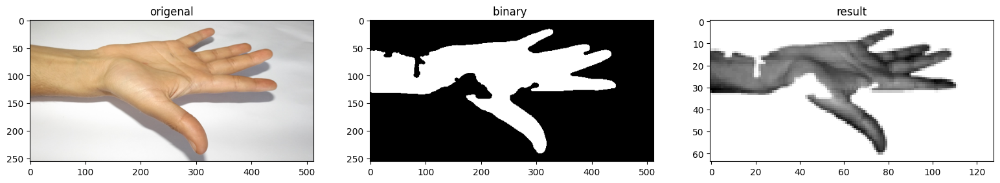

actualy:  5  predected : 2

./Dataset_new_filtered/women/5/5_woman (70).JPG


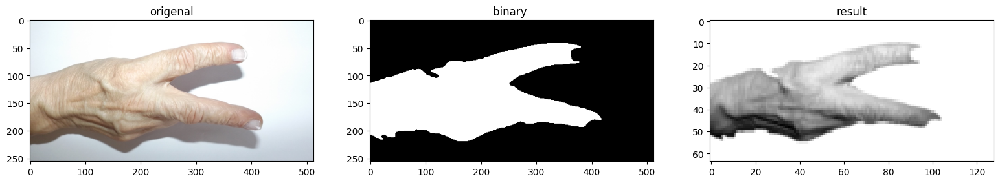

actualy:  2  predected : 3

./Dataset_new_filtered/women/2/2_woman (66).JPG


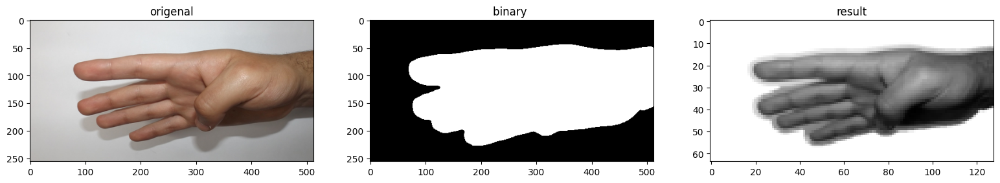

actualy:  4  predected : 3

./Dataset_new_filtered/men/4/4_men (45).JPG


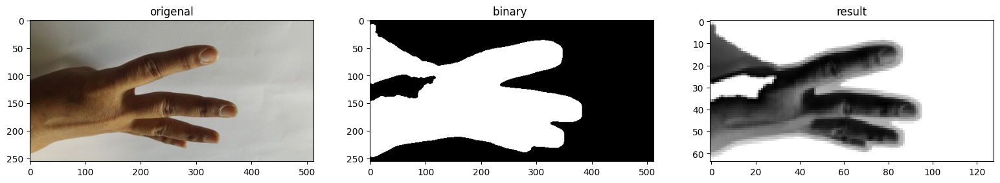

actualy:  4  predected : 5

./Dataset_new_filtered/women/4/4_woman (77).JPG


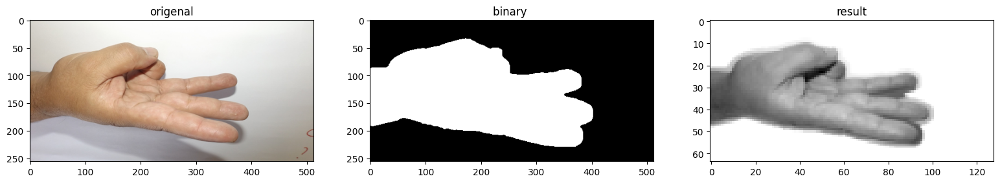

actualy:  3  predected : 5

./Dataset_new_filtered/men/3/3_men (14).JPG


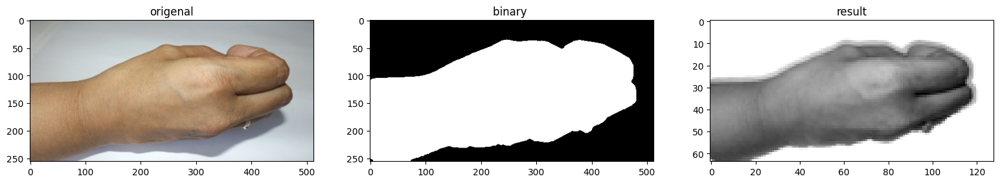

actualy:  0  predected : 3

./Dataset_new_filtered/women/0/0_woman (63).JPG


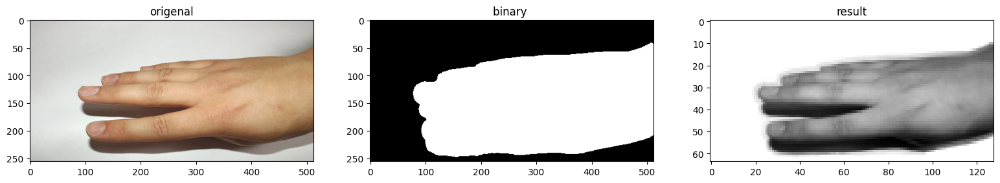

actualy:  4  predected : 3

./Dataset_new_filtered/women/4/4_woman (35).JPG


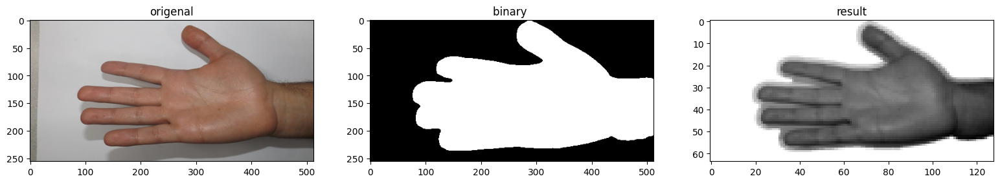

actualy:  5  predected : 4

./Dataset_new_filtered/men/5/5_men (30).JPG


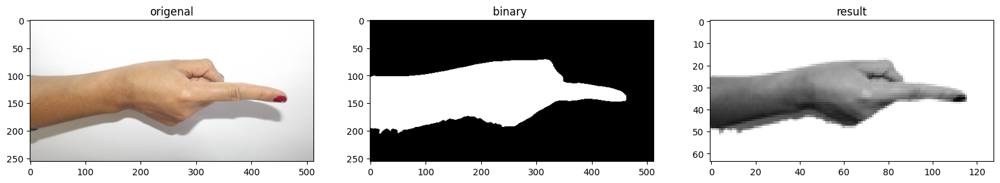

actualy:  1  predected : 2

./Dataset_new_filtered/women/1/1_woman (90).JPG


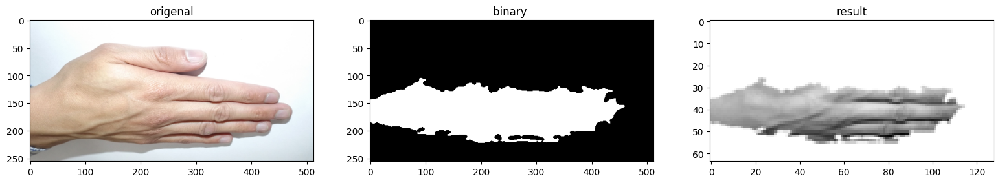

actualy:  5  predected : 4

./Dataset_new_filtered/men/5/5_men (91).JPG


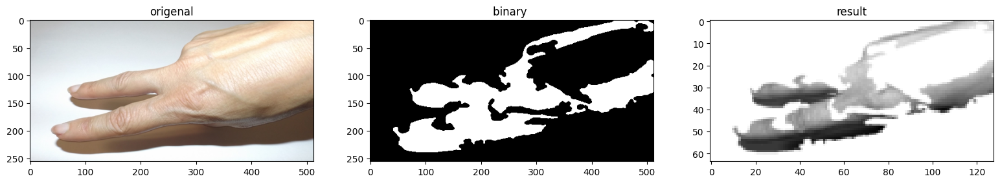

actualy:  2  predected : 3

./Dataset_new_filtered/women/2/2_woman (18).JPG


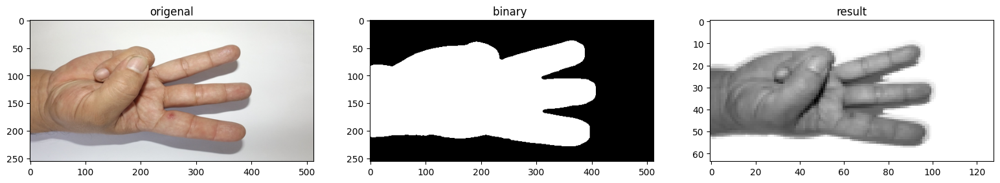

actualy:  3  predected : 4

./Dataset_new_filtered/men/3/3_men (15).JPG


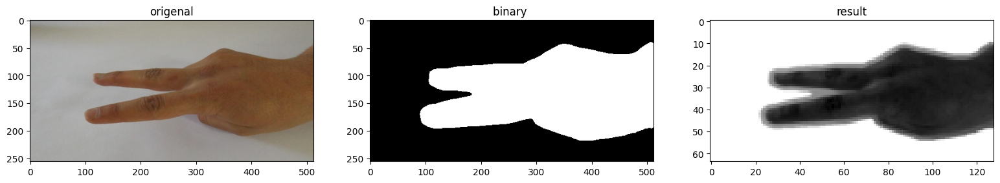

actualy:  2  predected : 3

./Dataset_new_filtered/men/2/2_men (151).JPG


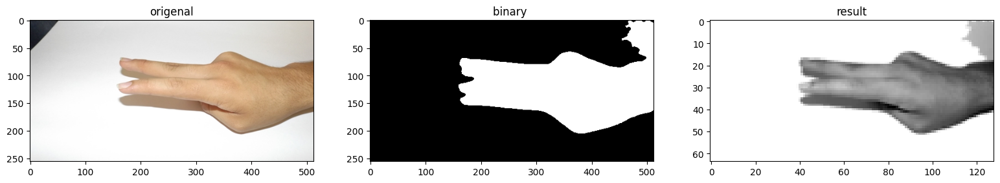

actualy:  2  predected : 3

./Dataset_new_filtered/men/2/2_men (78).JPG


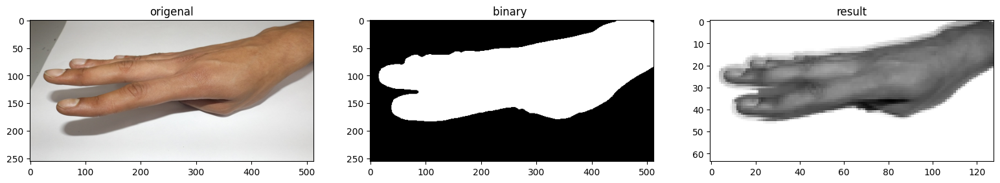

actualy:  4  predected : 3

./Dataset_new_filtered/men/4/4_men (84).JPG


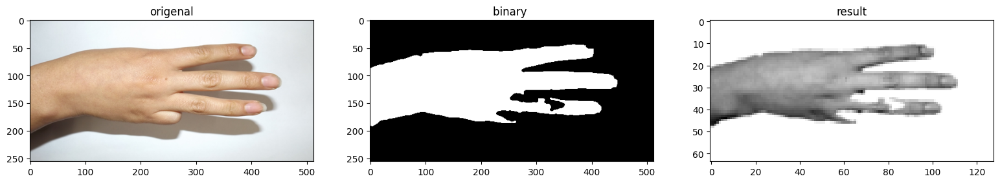

actualy:  3  predected : 4

./Dataset_new_filtered/women/3/3_woman (57).JPG


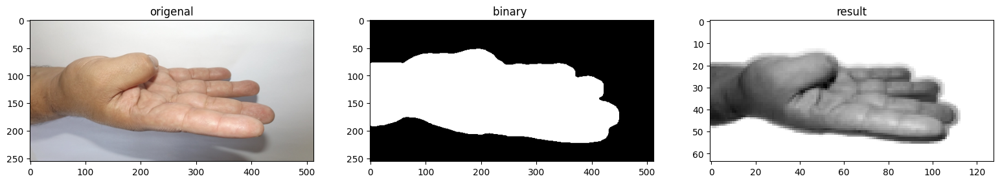

actualy:  4  predected : 3

./Dataset_new_filtered/men/4/4_men (28).JPG


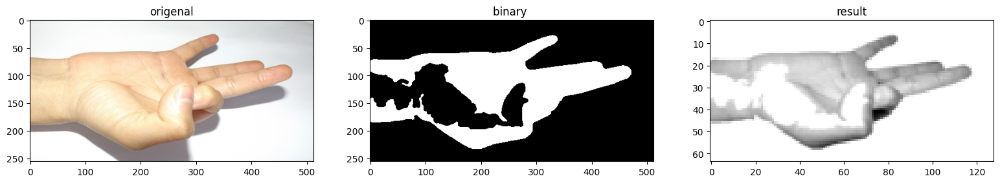

actualy:  3  predected : 1

./Dataset_new_filtered/women/3/3_woman (71).JPG


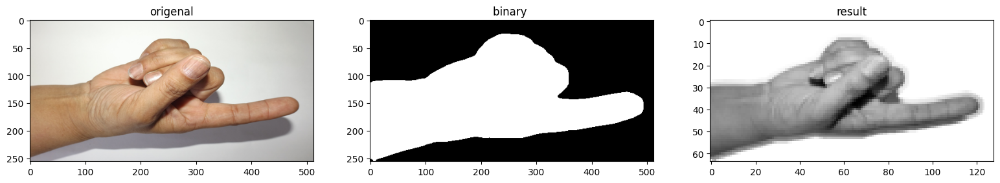

actualy:  1  predected : 0

./Dataset_new_filtered/women/1/1_woman (65).JPG


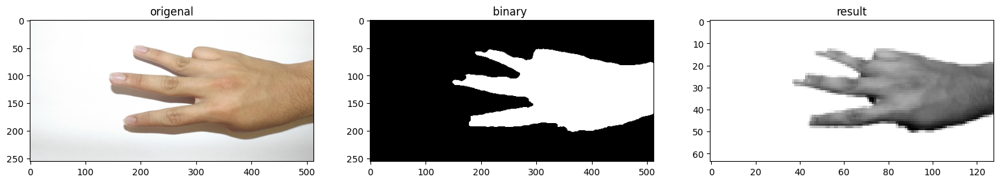

actualy:  3  predected : 4

./Dataset_new_filtered/men/3/3_men (107).JPG


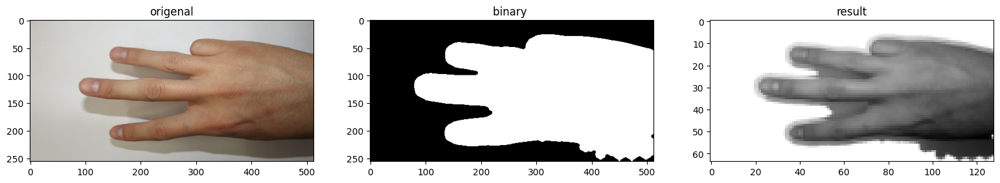

actualy:  3  predected : 4

./Dataset_new_filtered/men/3/3_men (42).JPG


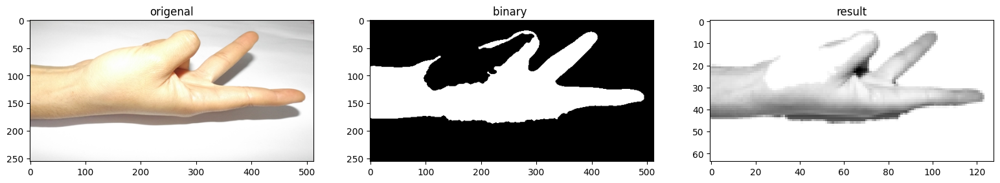

actualy:  2  predected : 1

./Dataset_new_filtered/women/2/2_woman (70).JPG


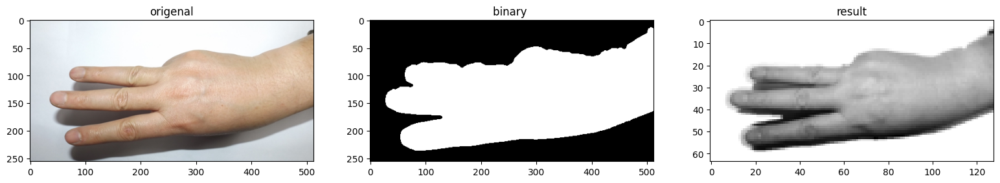

actualy:  3  predected : 2

./Dataset_new_filtered/men/3/3_men (131).JPG


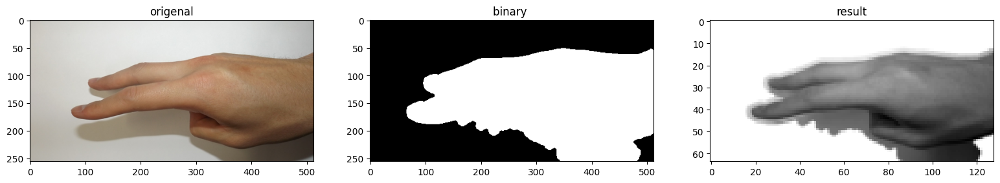

actualy:  2  predected : 3

./Dataset_new_filtered/men/2/2_men (15).JPG


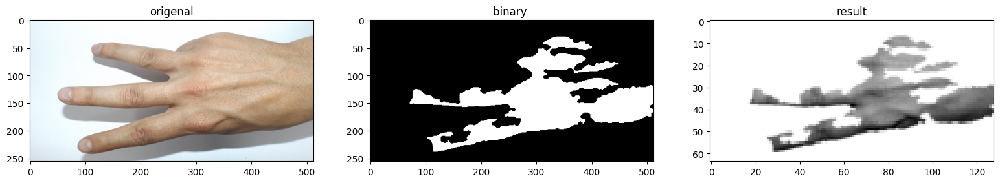

actualy:  3  predected : 4

./Dataset_new_filtered/men/3/3_men (66).JPG


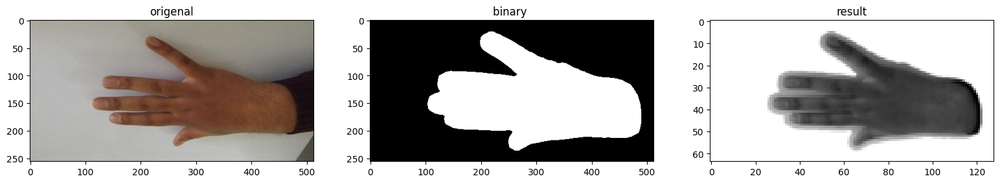

actualy:  5  predected : 4

./Dataset_new_filtered/men/5/5_men (157).JPG


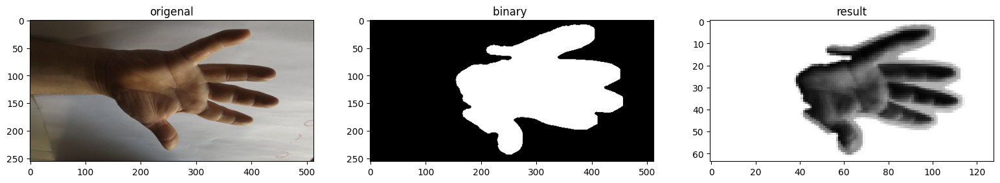

actualy:  5  predected : 0

./Dataset_new_filtered/men/5/5_men (19).JPG


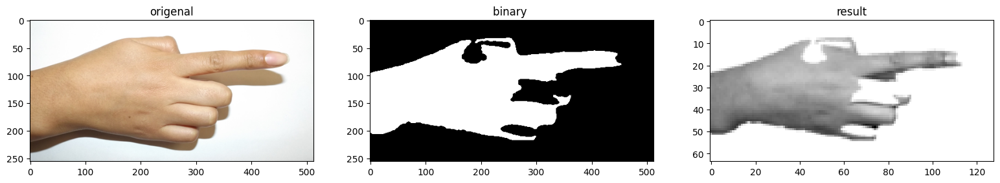

actualy:  1  predected : 5

./Dataset_new_filtered/women/1/1_woman (50).JPG


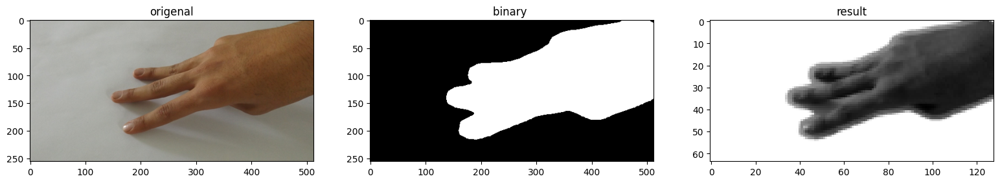

actualy:  3  predected : 4

./Dataset_new_filtered/men/3/3_men (178).JPG


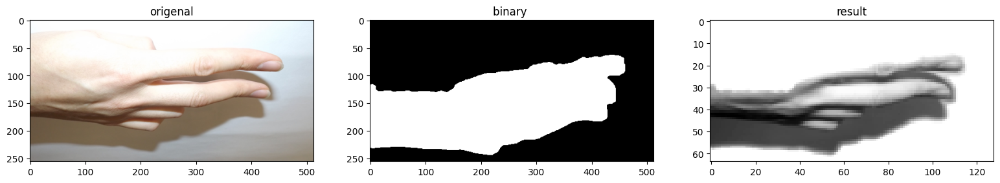

actualy:  2  predected : 3

./Dataset_new_filtered/women/2/2_woman (40).JPG


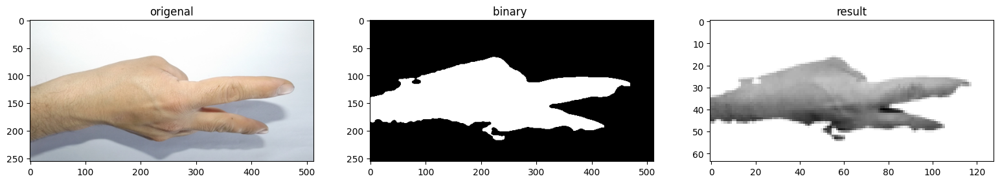

actualy:  2  predected : 1

./Dataset_new_filtered/men/2/2_men (134).JPG


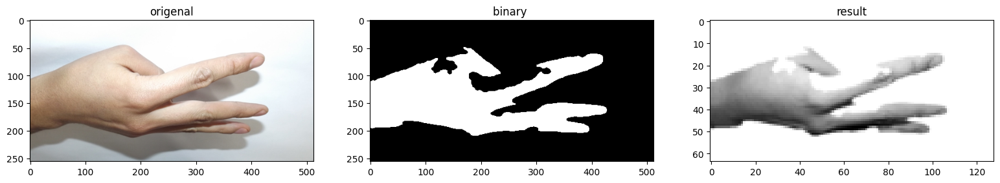

actualy:  3  predected : 2

./Dataset_new_filtered/men/3/3_men (5).JPG


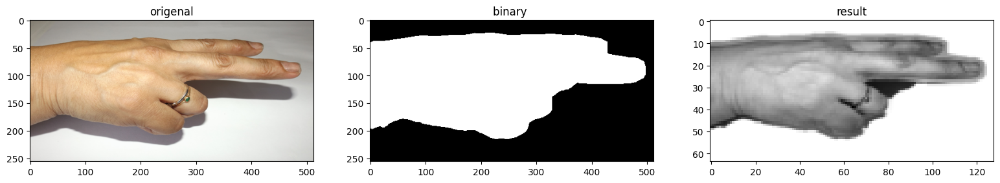

actualy:  2  predected : 1

./Dataset_new_filtered/women/2/2_woman (63).JPG


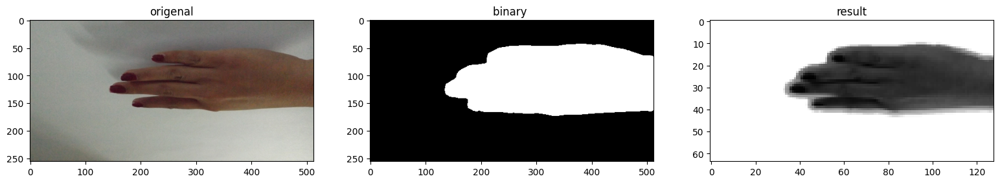

actualy:  4  predected : 3

./Dataset_new_filtered/women/4/4_woman (116).JPG


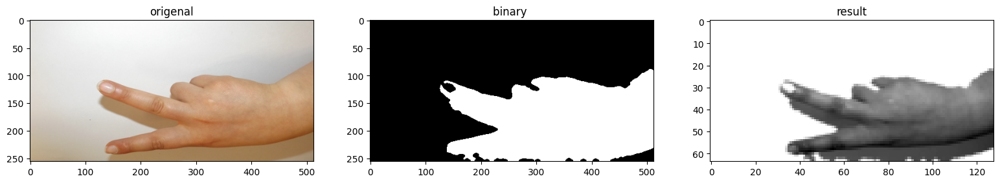

actualy:  2  predected : 3

./Dataset_new_filtered/women/2/2_woman (22).JPG


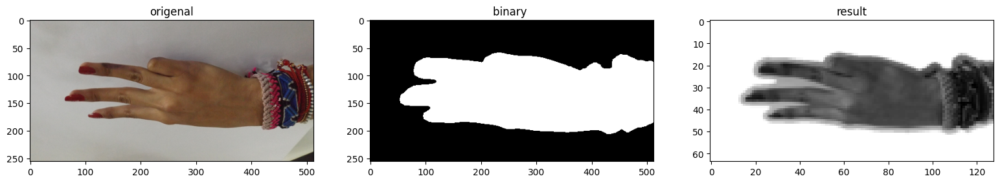

actualy:  3  predected : 4

./Dataset_new_filtered/women/3/3_woman (104).JPG


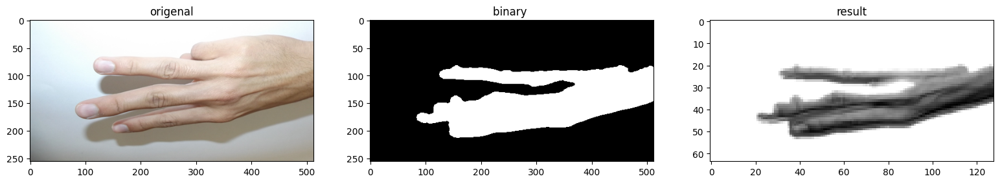

actualy:  3  predected : 1

./Dataset_new_filtered/men/3/3_men (118).JPG


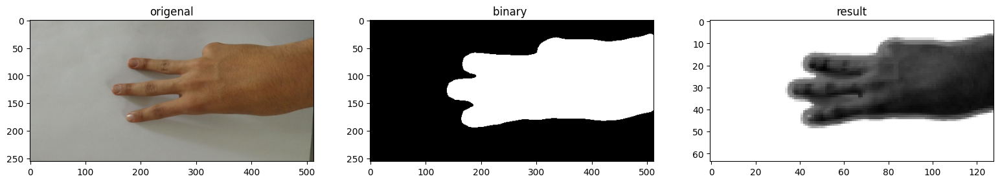

actualy:  3  predected : 2

./Dataset_new_filtered/men/3/3_men (177).JPG


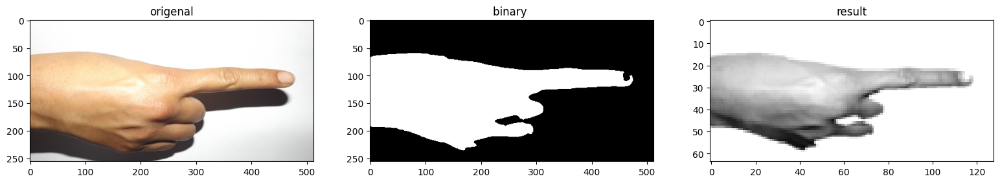

actualy:  1  predected : 2

./Dataset_new_filtered/men/1/1_men (29).JPG


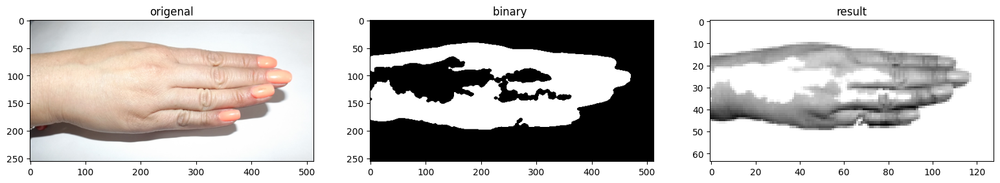

actualy:  4  predected : 3

./Dataset_new_filtered/women/4/4_woman (9).JPG


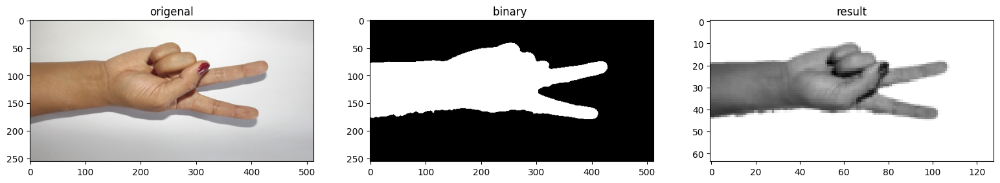

actualy:  2  predected : 4

./Dataset_new_filtered/women/2/2_woman (93).JPG


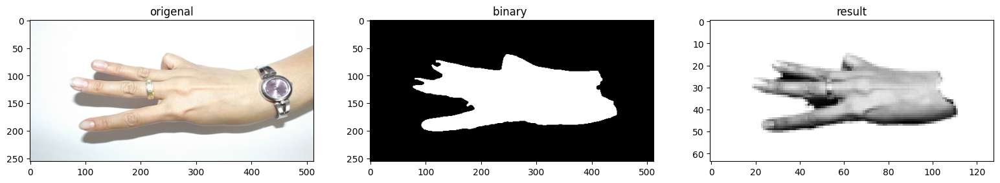

actualy:  3  predected : 4

./Dataset_new_filtered/women/3/3_woman (114).JPG


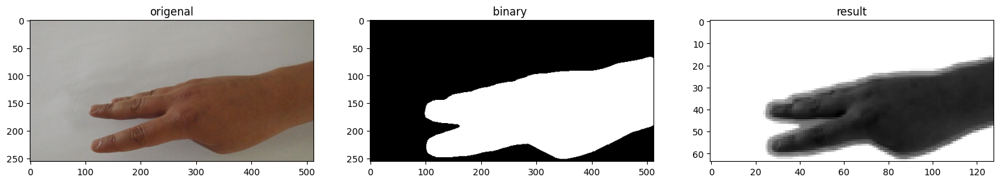

actualy:  3  predected : 0

./Dataset_new_filtered/women/3/3_woman (124).JPG


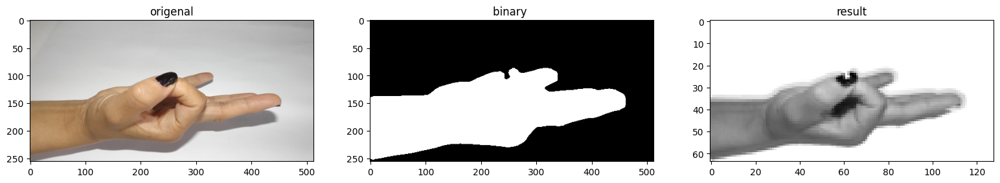

actualy:  3  predected : 1

./Dataset_new_filtered/women/3/3_woman (103).JPG


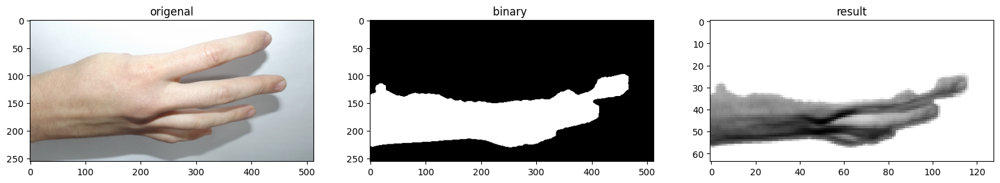

actualy:  4  predected : 1

./Dataset_new_filtered/men/4/4_men (94).JPG


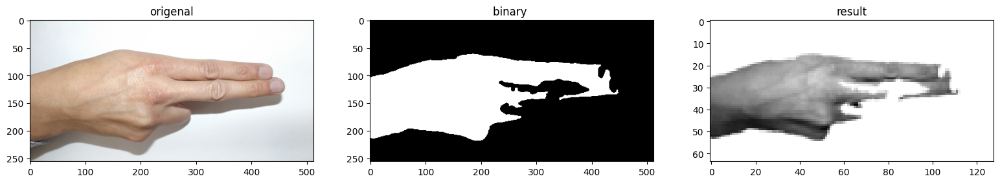

actualy:  2  predected : 3

./Dataset_new_filtered/men/2/2_men (65).JPG


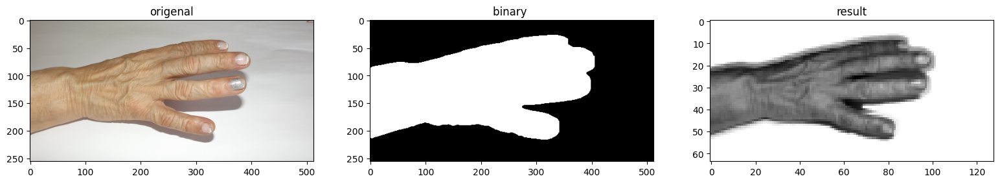

actualy:  4  predected : 5

./Dataset_new_filtered/women/4/4_woman (66).JPG


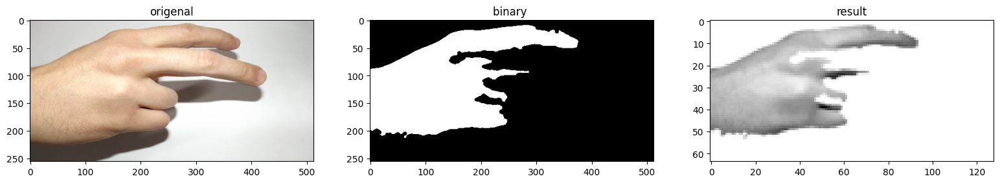

actualy:  2  predected : 1

./Dataset_new_filtered/men/2/2_men (51).JPG


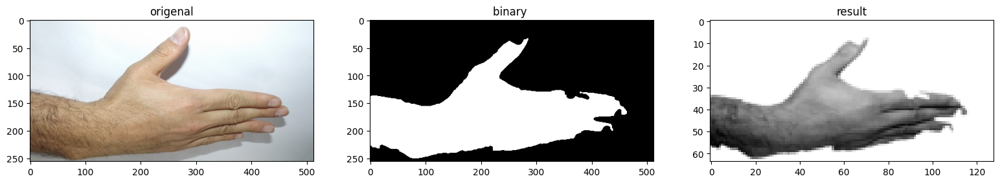

actualy:  5  predected : 1

./Dataset_new_filtered/men/5/5_men (124).JPG


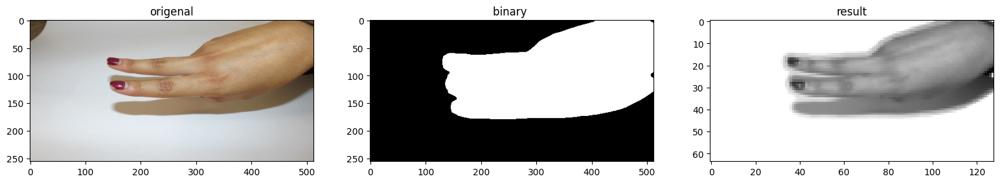

actualy:  2  predected : 3

./Dataset_new_filtered/women/2/2_woman (24).JPG


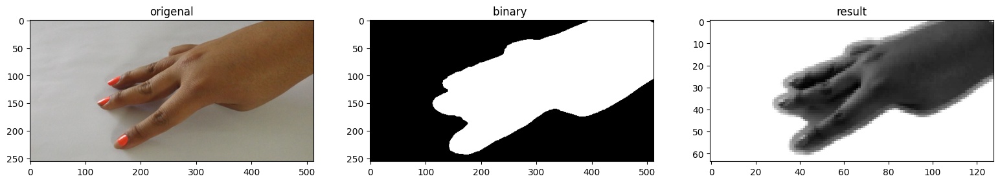

actualy:  3  predected : 4

./Dataset_new_filtered/women/3/3_woman (121).JPG


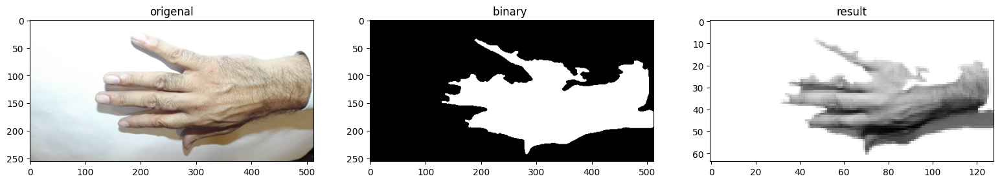

actualy:  5  predected : 4

./Dataset_new_filtered/men/5/5_men (88).JPG


In [20]:
# Specify the path to your text file
file_path = 'output.txt'
liens=[]
# Open the text file
with open(file_path, 'r') as file:
    # Read the contents of the file
    for line in file:
        liens.append(line.split(','))
directory='./Dataset_new_filtered'
for line in liens:
    actuly=line[0][0]
    pretected=line[1]
    gender_path= 'men' if line[0][2]=='m' else 'women'
    number_path = line[0][0]
    image_name=line[0]
    path= directory + '/' + gender_path + '/' + number_path + '/' +image_name
#     print(line[0],line[1])
#     print(path)
#     binary, result = image_pre_processing(path)
    binary, result = image_pre_processing(path)
    image = Image.open(path)
    image = resize(image, 4 * 128, 4 * 64)
    img_RGB = np.array(image)
    
    show_images([img_RGB, binary, result], ['origenal', 'binary ', 'result'])
    print('actualy: ',actuly,' predected :',pretected)
    print(path)